<a href="https://colab.research.google.com/github/lzeng11bc/DNNWithTensorflow/blob/main/ch13_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chapter 14. Deep Computer Vision Using Convolutional Neural Network
* **Perception largely take place outside the realm of our consciosness, withi specialized visual, auditory, and otehr senosory modules in our brain**
* **Convolutional neural networks(CNNS) emerged from the study of the barina's visual cortex, and they have been used in image recognition since the 1980s.**

## The Architecture of the Visual Cortex
* **Many neurons in the visual cortex have a small *local receptive field*, meaning they react only to visual stimuli located in a limited region of the visual field.**
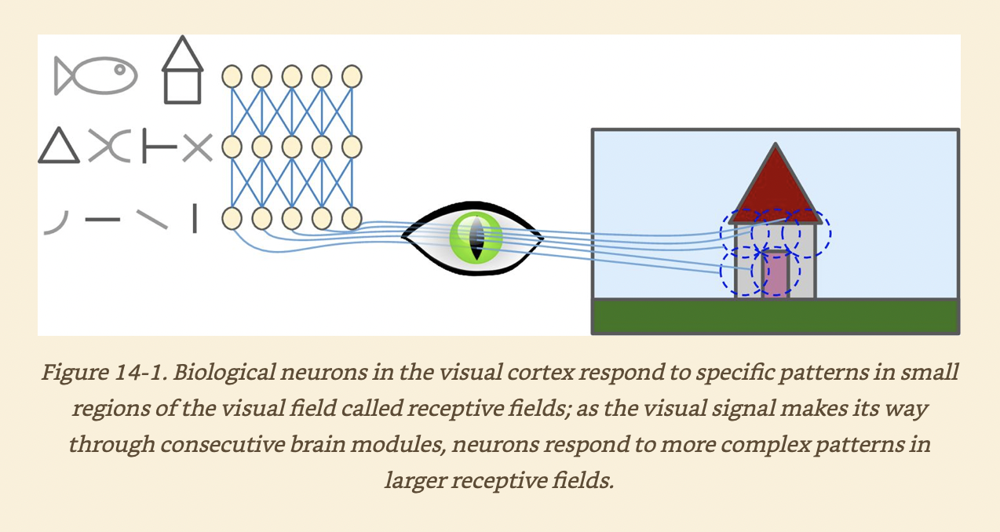

 

* **The receptive fields of different neurons may overlap, and togerther they tile the whole cisual fields.**
* **Some neurons react only to image of horizontal line, while others react only to lines with different orientations(two neurons may have the same receptive field but react to different line orientations).**
* **Some neurons have larger receptive fields, and they react to more complex patterns that are combinations of the lower-level patterns.**
* **These observations led to the idea that the higher-level neurons are based on the outputs of neighboring lower-level neurons.**

## Convolutionl Layers
* **The most important building block of a CNN is the *convolutional layer*.**
* **Neruons in the first convolutional layer are not connected to every single pixel in the input image, but only to pixels in their receptive fields.**
*  **In turn, each neuron in the second convolutional layer is conneced only to neurons located within a small rectangle in the first layer.**
    * **This architecture allosws the network to concetraate on samll low-level features in the first hidden layer, then assemble them into larger higher-level features in the next hidden layer, and so on.**
    

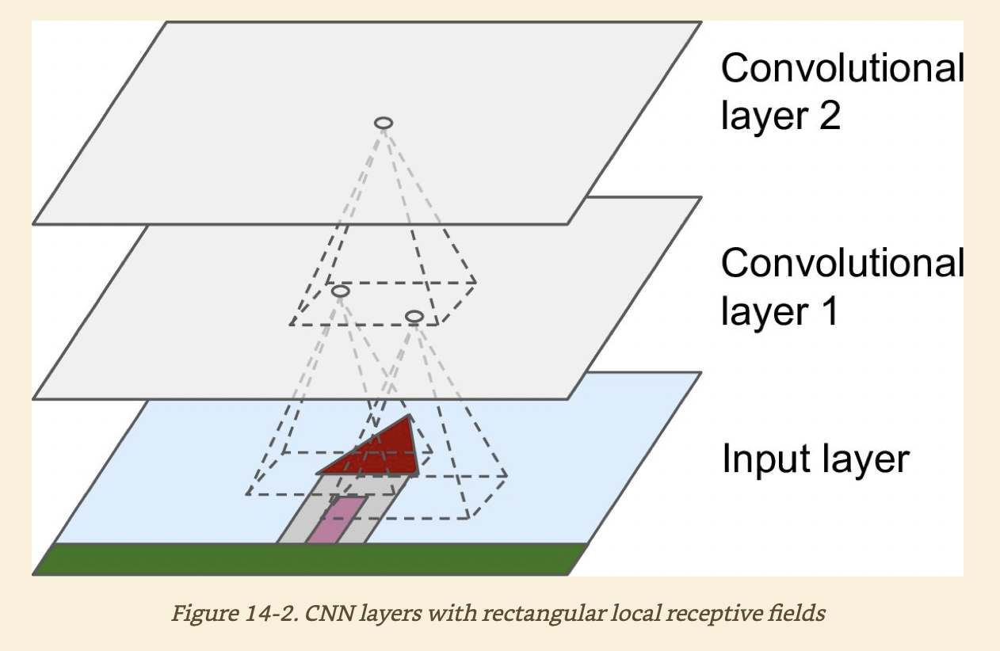

* **All the multiayer neural networks we've looked at so fat had layers composed of a long line of neurons, and we had to flaten input images to 1D before feeding them to neural network. In a CNN each layer is represented in 2D, which makes it easier to match neurons with their corresponding inputs.**

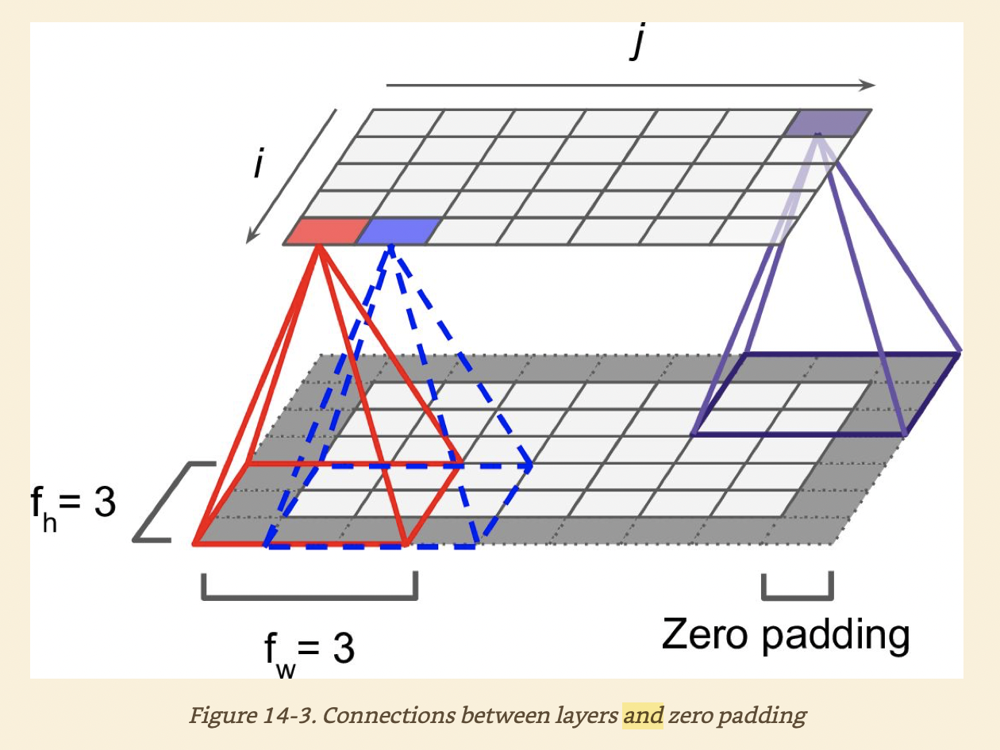

* **A neuron located in row $i$, column $j$ of a given layer is connected to the outputs of the neurons in the previous layer loacted in rowns $i$ to $f_h - 1$, columns $j$ to $j + f_w - 1$, where $f_h$ and $f_w$ are the height and width of the receptive field.**
* **In order for a layer to have the same height ahd width as the previous layer, it is common to add zeros around the inputs. This is called zero-padding.**
* **It is possible to connect a large input layer to a much smaller layer by spacing out the receptive fields. This dramatically reduces the model's computational complexity.**
    * **The shift from one receptive field to the next is called the *stride*.**

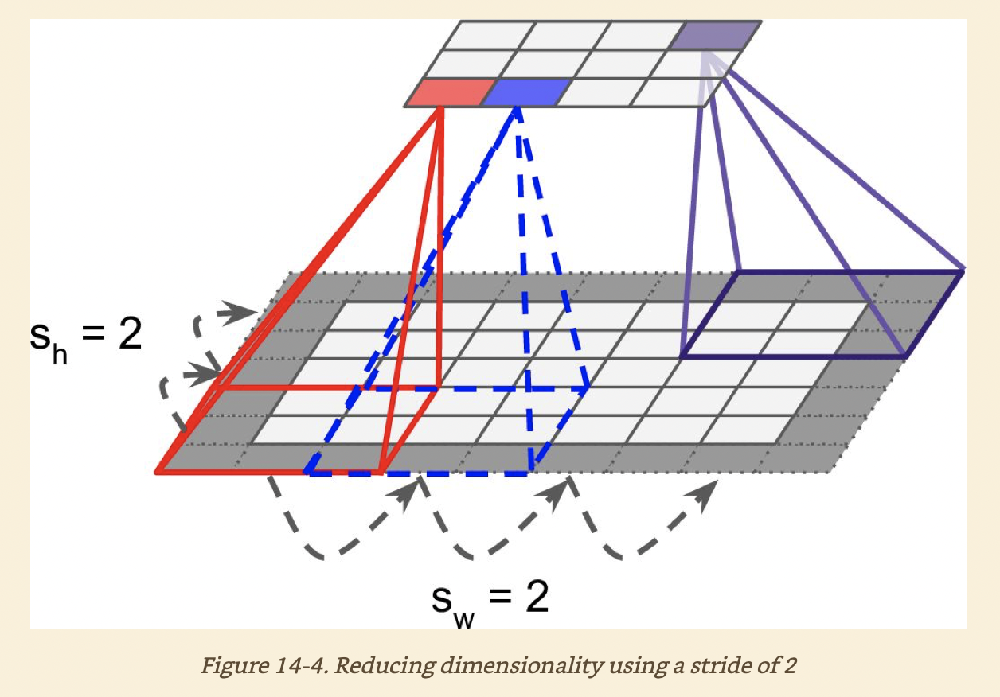

* **In the diagram, a $5 \times 7$ input layer(plus zero padding) is connected to a $3 \times 4$ layer, using $3 \times 3$ receptive fields and a stride of 2.**
* **A neuron located in row $i$, column $j$ in the upper layer is connected to the outputs of the neurons in the prevous layer located in rows $i \times s_h$ to $i \times s_h + f_h - 1$, columns $j \times s_W$ to $j \times s_W + f_W - 1$, where $s_h$ and $s_W$ are the vertical and horizontal strides.**

### Filters
* **A neuron's weights can be represented as a small image the size of the receptive fields.**

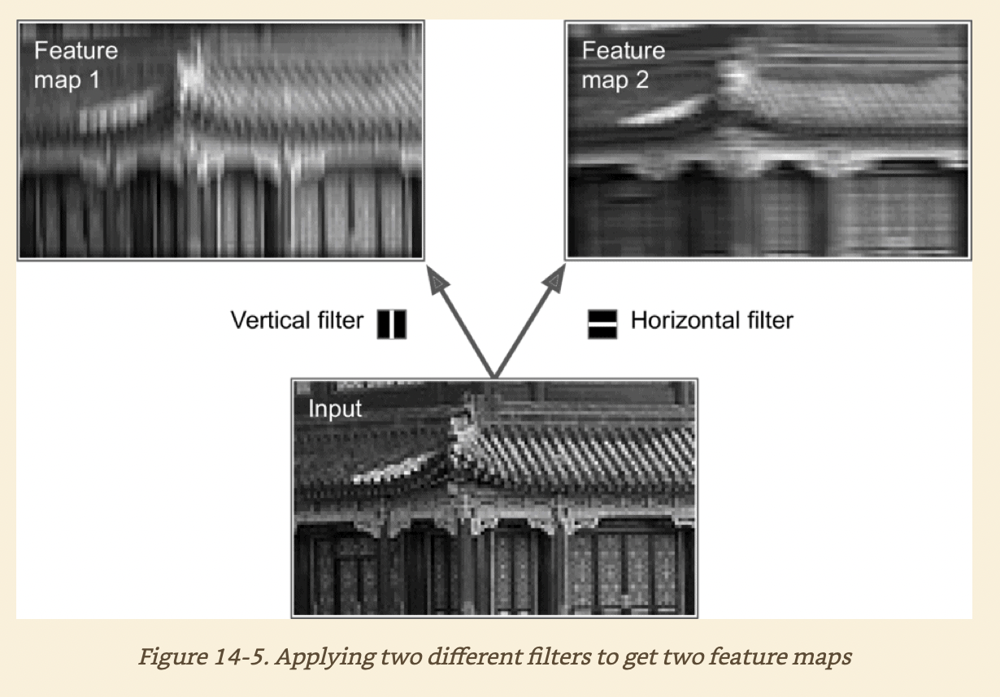

* **This figure shows two possible sets of weights, called *filters*(or *convolution kernesl*)**
* **The first one is represented as a black square with a vertical white line in the middle(it is a $7 \times 7$ matrix full of $0s$ except for the central column, which is full of $1s$.**
    * **Neurons using these weights will ignore everything in their respective fiels except for the central verticalline(since all inputs will get multiplied by 0, except for thee ones located in the central vertical line)**
* **The second filter is a black squre with a horizontal white line in the middle.**
    * **Neurons using these weights will ignore everything in their receptive field except for the central horizontal line.**
* **A layer full of neurons using the same filter outputs a *feature map*, which highlights the areas in an image that activate the filter the most.**
* **You do not have to define the filters manually: instead, durng training the convolutional layer will automatically learn the most useful filters for its task, adn the layers above will learn to combine them into complex patterns.**

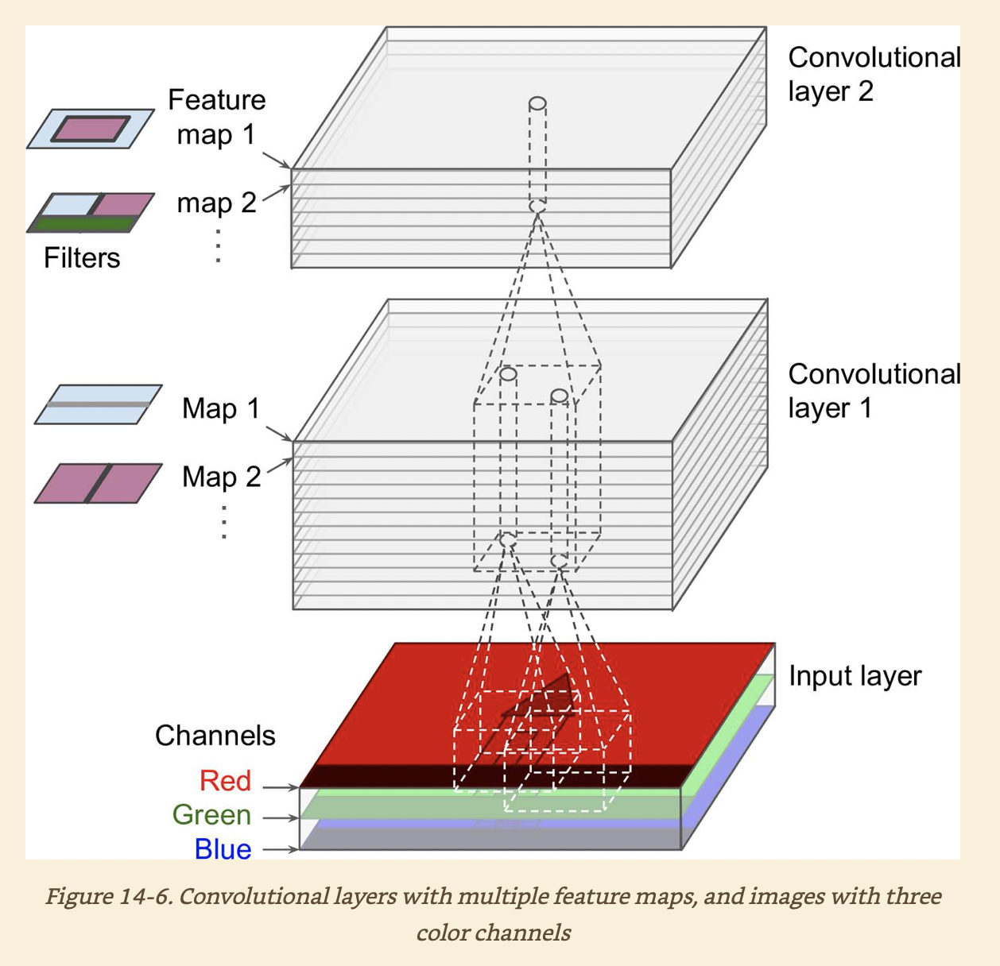

### Stacking Multiple Feature Maps
* **In reality, a convolutional layer has multiple filters and outputs one feature mapper filter, so it is more accurately represented in 3D.**
    * **It has one neuron per pixel in each feature map, and all neurons within a given feature map share the same parameters(i.e., the same weights and bias term).**
    * **Neurons in different feature map share the same parameters(i.e., the same weights and bias term).**
    * **The fact tha all neurons in a feature map sahre the same parameters dramatically reduces the number of parameters in the model.**
* **A neuron's receptive fieds extend across all the previous layer's feature maps. In short, a convolutional layer simultaneously applies multiple trainable filters to its inputs, making it capable of detecting multiple featues anywhere in its inputs.**
* **Input images are also composed of multiple sublayers: one per *color channel*. There are typically three: red, green, and blue(RGB). Grayscale images have just one channel, but some images may have more.**
* **Specifically, a neuron located in row $i$, column $j$ of the feature map $k$ in a given convolutional layer $l$ is connected to the outputs of the neurons in the previous layer $l-1$, located in rows $i \times s_h$ to $i \times s_h + f_h - 1$ and columns $j \times s_w$ to $j \times s_W + f_W - 1$, across all feature maps.(in layer $l -1$).**
* **All neurons located in the same row $i$ and column $j$ but in different feature maps are connected to the outputs of the exact same neurons in the previous layer.**

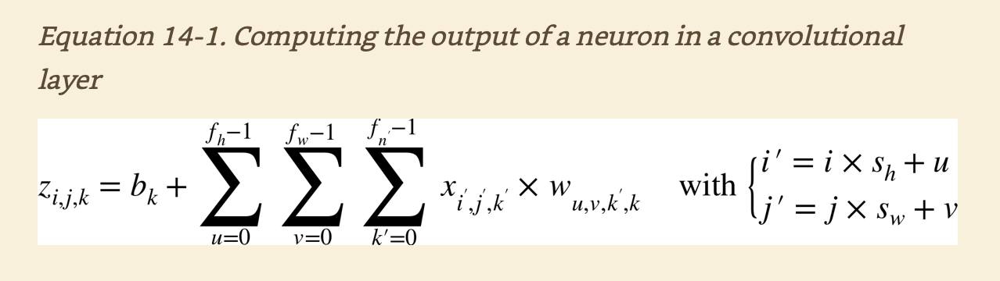

* **$z_{i, j, k}$ is the output of the neuron located in row $i$, column $j$ in feature map $k$ of the convolutional layer(layer $l$)**
* $s_h$ **and** $s_w$ **are the vertical and horizontal strides, $f_h$ and $f_W$ are the height and width of the receptive field, and $f_{n^{'}}$ is the number of feature maps in the previous layer(layer $l - 1$)**
* $X_{i^{'}, j^{'}, k^{'}}$ **is the output of the neuron locaed in layer $l-1$, row $i^{'}$, column $j^{'}$, feuature map $k^{'}$.**
* $b_K$ **is the bias term for feature map $k$(in layer $l$). You can think of it as a knob that tweaks the overall brightness of the feature map $k$.**
* $W_{u, v, k^{'}, k}$ **is the connection weight between any neuron in feature map $k$ of the layer $l$ and its input located at row $u$, column $v$(relative to the neuron's receptive field), and feature map $k^{'}$**<br>

***All the eqauion does is to calculate the weighted sum of all the inputs, plus the bias terms***

### TensorFlow Implementation
* **In TensorFlow, each input image is typically represented as a 3D tensor of shape \[heigh, width, channels\].**
* **A mini-batch is represented as a 4D tesnor of shape \[mini-batch size, height, width, channels\].**
* **The weighs of a convolutional layer are represented as a 4D tensor of shape $[f_h, f_w, f_{n^{'}}, f_n]$**
* **The bias terms of a convolutional layer are simply represented as a 1D tensor of shape $[f_n]$.**

In [1]:
pip install pillow

**Loads two sample images(which loads two color images, on of a Chines temple, and the other of a flower)**

In [2]:
from sklearn.datasets import load_sample_image
import numpy as np

# Load Sample images
china = load_sample_image("china.jpg") / 255
flower = load_sample_image("flower.jpg") / 255
images = np.array([china, flower])
batch_size, height, width, channels = images.shape

* **The pixel intensity for each color channel is represented as a byte from 0 to 255, so we scale these features by dividing by 255**

**Create tow filters and applies them to both images**

In [3]:
# Create 2 filters
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32)
filters[:, 3, :, 0] = 1 # vertical line
filters[3, :, :, 1] = 1 # horizontal line

* **We create two $7 \times 7 $ filters(one with a vertical white line in the middle, and the other with a horizontal white line in the  middle)**

In [5]:
import tensorflow as tf
outputs = tf.nn.conv2d(images, filters, strides=1, padding="SAME")

* **We apply both images using the** tf.nn.conv2d( ) **function, using zero padding and stride of 1**

**Dispplays one of the resulting feature maps**

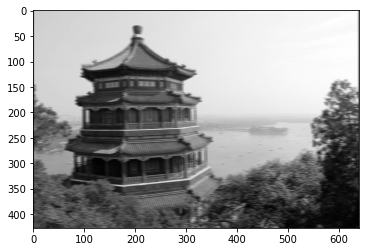

In [6]:
import matplotlib.pyplot as plt
plt.imshow(outputs[0, :, :, 1], cmap="gray") # plot 1st image's 2nd feature map
plt.show()

* **We plot one of the resulting feature maps, with a vertical stride.**

##### tf.nn.conv2d( )
* images **is the input mini-batch(a 4D tensor)**
* filters **is the set of filters to apply(also a 4D tensor)**
* strides **is equal to 1, but it could also be a 1D array with four elements, where the two central elements are the vertical and horizontal strides($s_h$ and $s_w$). The first and lat elements must "currently" be equal to 1.**
* padding **must be either** "SAME" **or** "VALID".

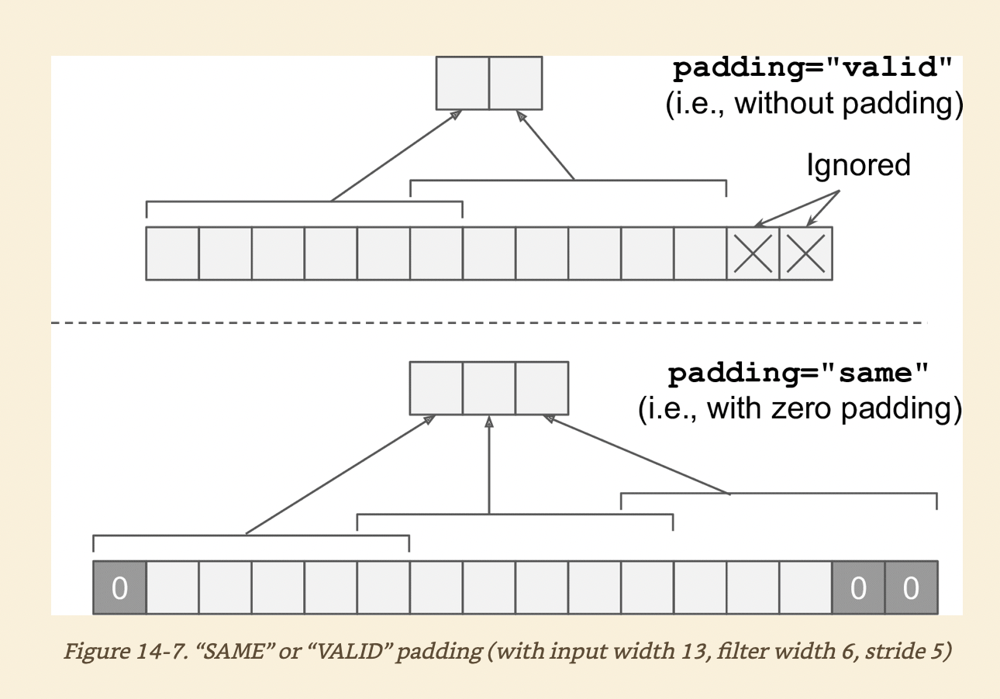

* **If padding is set to "SAME", the convolutional layer uses zero padding if necessary. The output size is set to the number of input neurons divided by the stride, rounded up.**
    * **For example if the input is 13 and the stride is 5, then the output size is 3, (i.e., 13/5 = 2.6, rounded up to 3)**
    * **When** strides=1, **the layer's outputs will have the same spatial dimensions(width and height) as its inputs, hence the name *same***
* **If padding is set to "VALID", the convolutional layer does not use zero padding and may ignore some rows and columns atthe bottom and riht of the input image, depending on the stide.**
    * **This means that every neuron's receptive field lies strictly within calid positions inside the input(it does not go out of bounds), hence the name *valid*.**

**In real CNN we would normally define filters as trainable variables so the neural net can learn which filters work best.**

In [7]:
from tensorflow import keras

In [8]:
conv = keras.layers.Conv2D(filters=32, kernel_size=3, strides=1,
                           padding="same", activation="relu")

* **The code created a** Conv2D **layer with 32 filters, each $3 \times 3$, using a stride of $1$(both horizontally and vertically) and "same" padding, and applying the ReLU activation funcion to its outputs.**

### Memory Requirements
* **Another problem with CNNs is that convolutional layers require a huge amount of RAM.**
* **If training crashes because of an out-of-memory error, you can try reducing the mini-batch size.**
* **Alternativey, you can try reducing dimensionality using a stride, or removing a few layers.**
* **Or you can try using 16-bit floats instead of 32-bit floats.**
* **Or you could distribute the CNN across multiple devices.**

## Pooling Layers
* **The goal is to *subsample*(i.e., shrink) the input image in order to reduce the compultation load, the memory usage, and the number of parameters(therey limiting the risk of overfitting).**
* **Just like in convolutional layers, each neuron in a pooling layer is connected to the outputs of a limited number of neurons in the previous layer, located within a small rectangular receptive field.**
* **You must define its size, the stride, the padding type.**
* **A pooling neuron has no weights; all it does is aggregate the inputs using an aggregation function such as the max or the mean.**

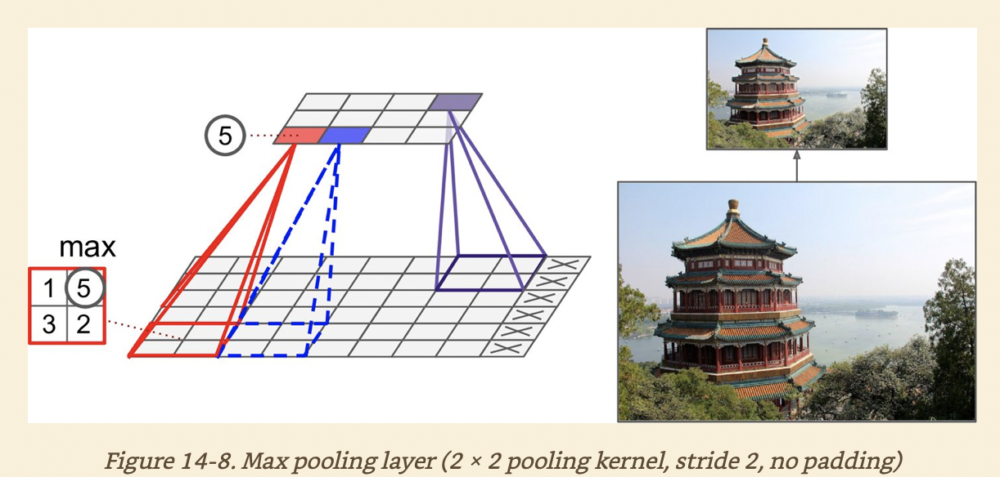

**Uses a $2 \times 2$ *pooling kernel*, with a stride of 2 and no padding.**
* **Only the max input value in each receptive field makes it to the next layer, while the other inputs are dropped.**
* **A pooling layer typically works on every input channel independentlu, so the output depth is the same as the input depth.**

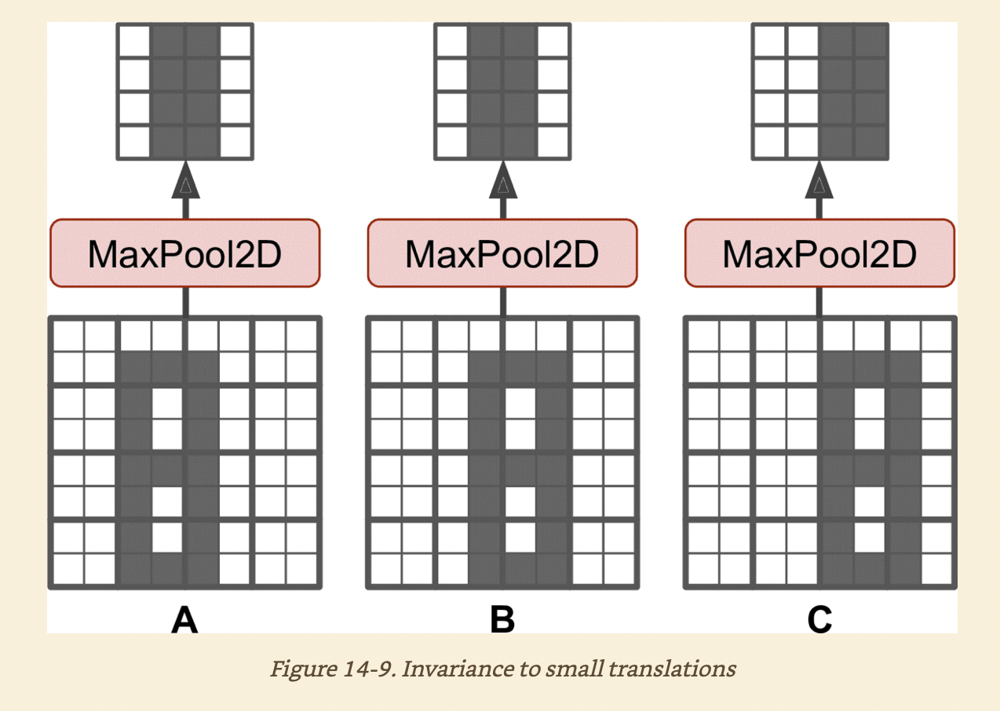

***A max pooling layer introduces some level of invariance to small translations.***

* **Assume that the bright pixels have a lower value than dark pixels, and we consider three images $(A, B, C)$ going through a max pooling layer with a $2 \times 2$ kernel and stride 2.**
* **Images B and C are the same as image A, but shifted by one and two pixels to the right.**
    * **The outputs of the max pooling layer for images A and B are identical. This is what translation invariance means.**
    * **For image C, the output is diferent: it is shifted one pixel to the right(but there is still 50% invariance).**
* **By inserting a max pooling layer every few layers in a CNN, it is possible to get some level of translation invariance at large scale.**
* **Max pooling offers a small amount of rotational invariance and slight scale invariance.**

##### Downside of Max Pooling
* **Very desctructie: in some applications invariance is not desriable.**


### TensorFlow Implementation
**Creates a maxpooling layer using a $2 \times 2 $ kernel.**
* **The stidess defualt to the kernel size, so this layer will use a stride of 2(both horizontally and vertically).**
* **By defualt, it uses "valid" padding.**

In [9]:
max_pool = keras.layers.MaxPool2D(pool_size=2)

**To creat an *average pooling layer*, just use** AvgPool2D **instead of** MaxPool2D
* **It works exactly the same as a max pooling layer, except it computes the mean rather than max.**
* **People mostly use max pooling layers now, as they generally perform beter**

In [10]:
avg_pool = keras.layers.AvgPool2D(pool_size=2)

* **Max pooling and avergae pooling can be performed along the depth dimension rather than spatial dimensions.**
    * **This can allow the CNN to learnto be invariant to various features. For example, it could learn multiple filters, each detecting a differnt rotation of the same pattern, and the depthwise max mpooling would ensure that the output is the same regardless.**
* **The CNN could similarly learn to be invariant to anything else: thickness, brightness, skew, color and so on.**

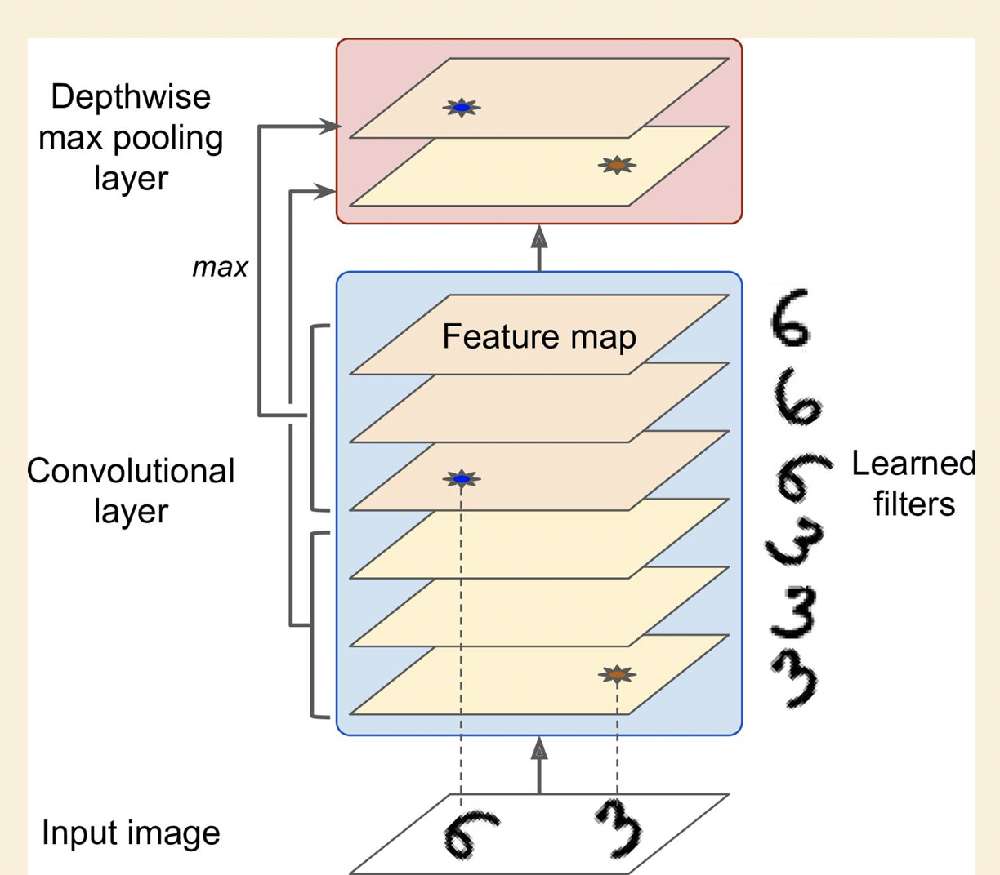

* **Keras des not include a depthwise max pooling layer, but TensorFlow's low-level Deep Learning API does: just use the** tf.nn.max\_pool( ) **function, and specify the kernel sizes**
    * **The first three values of each should be 1: tis indicates that the kernel size and stride along the batch, height, and width dimensions should be 1.**
    * **The last value should be whatever kernel size and stride you want along the depth dimension. The last value must be a divisor of the input depth; it will not work if the previos layer outputs 20 feature maps, since 20 is not  multiple of 3.**

**Depth pooling is only currently implemented for CPU device**

In [ ]:
output = tf.nn.max_pool(images,
                        ksize=(1, 1, 1, 3), 
                        strides=(1, 1, 1, 3),
                        padding="VALID")

* **If you want ot include a depth-pooling layer in your model, wrap ir in a** Lambda **layer**

In [ ]:
depth_pool = keras.layers.Lambda(lambda X: tf.nn.max_pool(X, ksize=(1, 1, 1, 3), 
                                                          strides=(1, 1, 1, 3),
                                                          padding=("VALID")))

##### Global Average Pooling
* **It computes the mena of each entire feature map(like an average pooling layer using a pooling kernel with the same spatial dimensions as the inputs.)**
* **It just ouputs a single number per feature map and per instance.**

**To create such a layer, use the** keras.layers.GloabalAvgPool2D **class**

In [ ]:
global_avg_pool = keras.layers.GlobalAvgPool2D()

**It is equivalent to this** Lambda **layer, which computes the mean over the spatial dimension**

In [12]:
global_avg_pool = keras.layers.Lambda(lambda X: tf.reduce_mean(X, axis=[1, 2]))

## CNN Architectures
* **Typical CNN architectures stack a few convolutional layer(each  one generally followed by a ReLU layer), than a polling layer, then another convolutional layers(+ReLU), then another pooling layer, and so on.**
    * **The image gets smaller and smaller as it progresses through the network, but it also gets deeper and deeper(i.e., wit more feature maps), thanks to the convolutional layers.**
    * **At the top of the stack, a regular feedforward nueral netowrk is added, composed of a few fully connected layers(+ReLUs) and the final layer outputs the prediction(e.g., a softmax layer that outputs estimated cass probabilities)**
* **A common mistake is to use convolutio kernels that are too large. Instead of using a convolutional layer with a $5 \times 5$ kernel, stack two layers with $3 \times 3$ kernels: it will use fewer parameters and require fewer computations, and it will usually perform better.**
    * **One exeption is for the first convolutional layer: it cann typically have large kernel(e.g., $ 5 \times 5$), usually wiht a stride of 2 or moreL this will reduce the spatial dimension of the image without loosing too much information, and since the iput image only has three channels in general, it will not be too costly.**

In [14]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

X_mean = X_train.mean(axis=0, keepdims=True)
X_std = X_train.std(axis=0, keepdims=True) + 1e-7
X_train = (X_train - X_mean) / X_std
X_valid = (X_valid - X_mean) / X_std
X_test = (X_test - X_mean) / X_std

X_train = X_train[..., np.newaxis]
X_valid = X_valid[..., np.newaxis]
X_test = X_test[..., np.newaxis]

4423680/4422102 [==============================] - 0s 0us/step


In [13]:
model = keras.models.Sequential([
                                 keras.layers.Conv2D(64, 7, activation="relu",
                                                     padding="same",
                                                     input_shape=[28, 28, 1]),
                                 keras.layers.MaxPooling2D(2),
                                 keras.layers.Conv2D(128, 3, activation="relu",
                                                     padding="same"),
                                 keras.layers.Conv2D(128, 3, activation="relu",
                                                     padding="same"),
                                 keras.layers.MaxPooling2D(2),
                                 keras.layers.Conv2D(256, 3, activation="relu",
                                                     padding="same"),
                                 keras.layers.Conv2D(256, 3, activation="relu",
                                                     padding="same"),
                                 keras.layers.MaxPooling2D(2),
                                 keras.layers.Flatten(),
                                 keras.layers.Dense(128, activation="relu"),
                                 keras.layers.Dropout(0.5),
                                 keras.layers.Dense(64, activation="relu"),
                                 keras.layers.Dropout(0.5),
                                 keras.layers.Dense(10, activation="softmax")
])

* **Thie first layer uses 64 fairly large filters ($7 \times 7$) but only stride 1 because the input images are not very large. It also sets** input\_shape = \[28, 28 , 1\], **because the omages are $28 \times 28 $ pixels, with a single color channel**
* **Next we have a max pooling layer which uses a pool size of 2, so it divides each spatial dimension by a factor of 2**
* **Then we repea the same structrue twice: two convolutional layers followed by a max pooling layer. For larger images, we could repeat this structure several more times.**
* **Note that the number of filters grows as we climb up the CNN toward the putput layer(it is intially 64, then 128, then 256): since the number of low-level feaures is often fairly low(e.g., small circles, horizontal lines), but there are many different ways to combine them into higher-level features.**
    * **It is a common practice to double the number of filters agter each pooling layer**
* **Next is the fully connected netwok, composed of two hidden dense layers and a dense output layer.**
    * **we must flatten its inputs, since a dense network expects a 1D array of features for each instance. We also add two dropout layers, with a dropout rate of 50% each, to reduce overfitting.**

In [15]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid))
score = model.evaluate(X_test, y_test)

Epoch 1/10
1719/1719 [==============================] - 11s 6ms/step - loss: 1.0231 - accuracy: 0.6391 - val_loss: 0.3877 - val_accuracy: 0.8636
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4449 - accuracy: 0.8485 - val_loss: 0.3465 - val_accuracy: 0.8806
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3624 - accuracy: 0.8776 - val_loss: 0.2995 - val_accuracy: 0.8862
Epoch 4/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3234 - accuracy: 0.8888 - val_loss: 0.2977 - val_accuracy: 0.8936
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3148 - accuracy: 0.8930 - val_loss: 0.3019 - val_accuracy: 0.8882
Epoch 6/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2879 - accuracy: 0.9016 - val_loss: 0.2826 - val_accuracy: 0.8986
Epoch 7/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2749 - accuracy: 0.9062 - val_loss: 0.2873 - val_accur

### LeNet-5
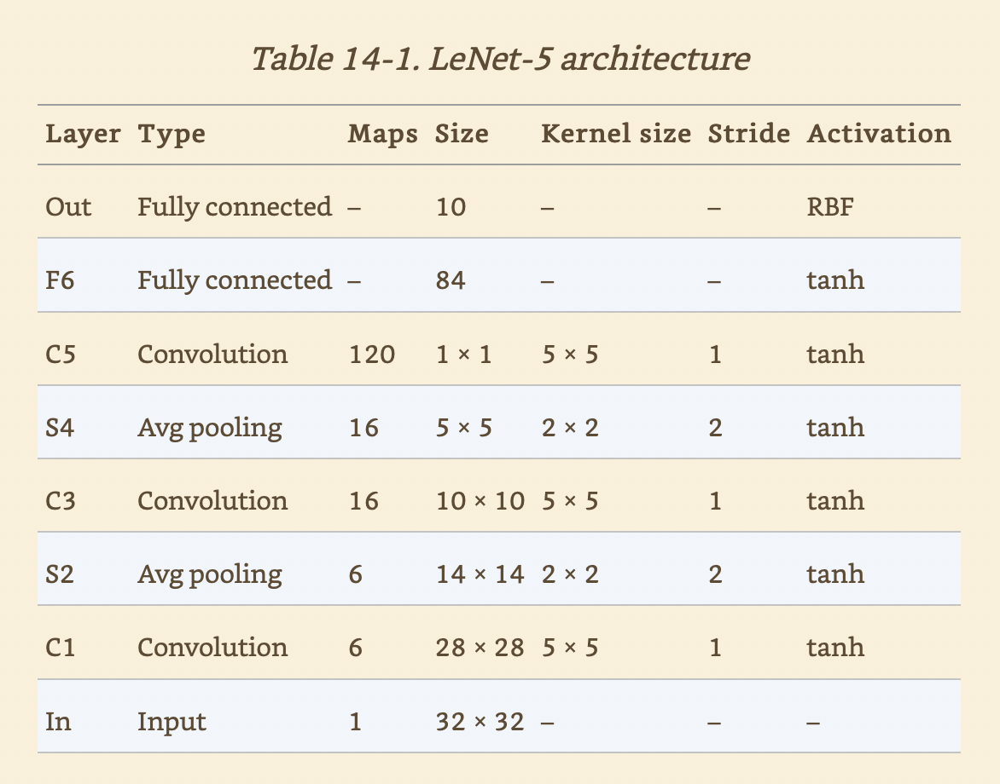

* **Mnist images are $ 28 \times 28 $ piexels, but they are zero-padded to $32 \times 32$  pixels and normalized before being fed the network.**
    * **The rest of the network does not use any padding, which is why the size keeps shrinking as the image progresses through the network**
* **The average pooling layers are slightly more complex than usual: each neuro computes the mean of its inputs, then multiplies the result by a learnable coefficient(one per map) and adds a learnable bias term(again, one per map), then fianlly applies the activation funciton**
* **Most neurons in $C3$ maps are connected to neurons in only three or four $S@$ maps(instead of all six $S2$ maps).**
* **For the output layer, instead of computing the matrix multiplication of the inputs and the weight vector, each neuron outputs the square of the Euclidian distance between its input vector and its weight vector.**
    * **Each output measures how much the image belomgs to a particualr digit class. The cross-entroypy cost function is now preferred, as it penalizes bad predictios much more, producing larger gradients and converging faster.**

### AlexNet 
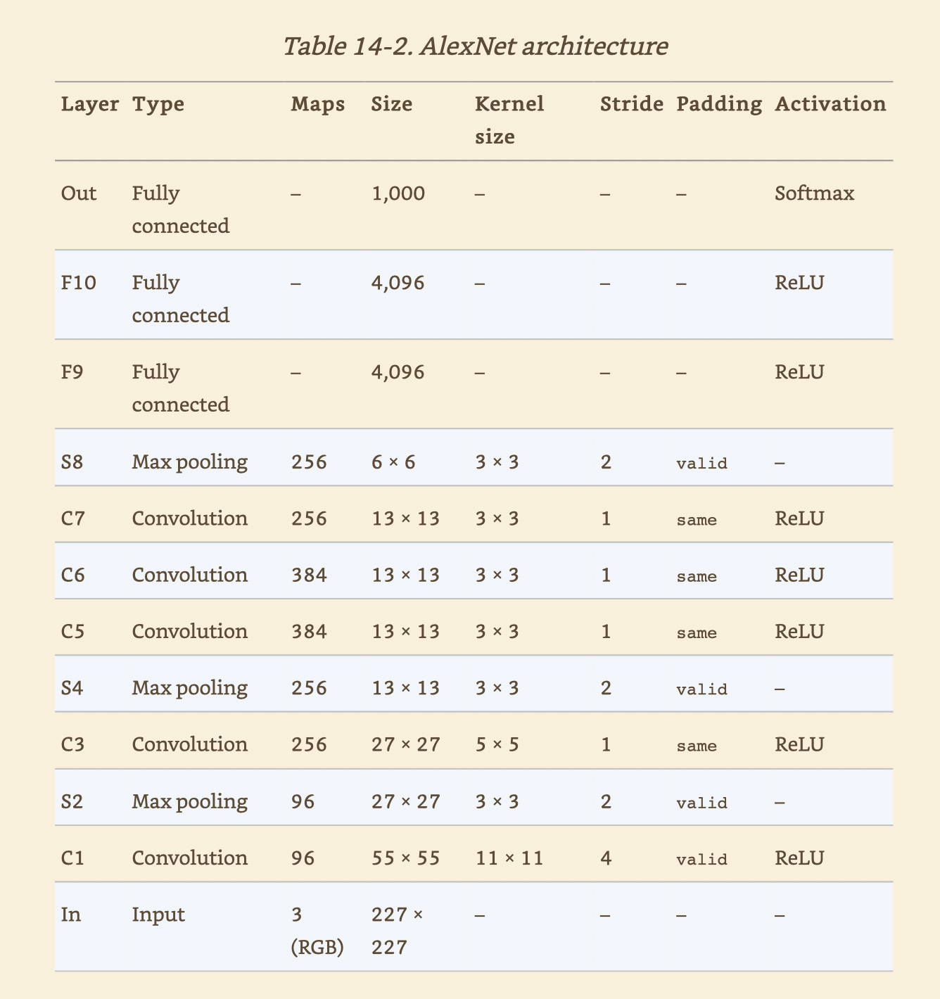

* **To reduce overfitting, the aurthor used two regularization techniques.**
    * **They applied dropout with a 50% dropout rate during training to the outputs of layers F9 and F10.**
    * **They performed *data augmentation* by randomy shifting the training images by various offsets, flipping them horizontally, and changing the lighting conditions.**

##### Data Augmentation
* **Data augmentation artificially increases the size of the training set by generating many realistic variants of each training instances. This reduces overfitting, making this a regularization technique.**
* **For instance, you can slightly shift, rotae, and resize at everty picture in the training set by various amounts and add the resulting pictures to the training set. This forces the model to be more tolerant to variantions in the position, orientation, and size of the objects in the pictures.**

##### Local Response Normalization
* **Alexnet also uses a competitive normalization step immediatel after the ReLU ste of layers C1 and C3, called *local response normalization*.**
* **The most strongly activated neurons inhibit other neurons located at the same position in neighboring feature maps(such competitive activation has been observed in biological neurons)**
* **This encourgaes different feature maps to sepcialize, pushing them apart and forcing them to explore a wider range of features, ultimately improving generalizations.**

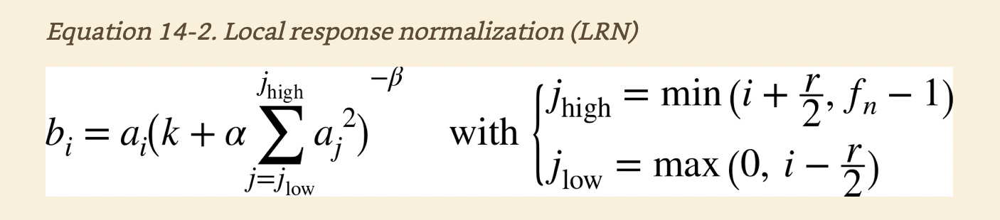

* $b_i$ **is the normalized output of the neuron located in feature map $i$, at some row $u$ and column $v$**
* **$a_i$ is the activation of that neuron after the ReLU step, but before normalization**
* **$k, \alpha, \beta$ and $r$ are hyperparameters. $k$ is called the *bias*, and $r$ is called the *depth radius.***
* $f_n$ **is the number of feature maps**
* **In AlexNet, the hyperparameters are set as follows: $r=0.5, \alpha = 0.0001, \beta = 0.75$ and $k=2$.